# Demonstration of blade perturbation capability

This notebook ...

In our proposed shape representation framework, we define a space of airfoils over a submanifold of the Grassmannian using Principal Geodesic Analysis (PGA). PGA is a data-driven approach that determines principal components as important directions in a tangent space defined at an intrinsic mean over smooth manifold-valued data. Thus, this novel definition of shape-space can be used to define a non-linear analytic generative model of airfoils.

In [1]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style='ticks')

from g2aero.Grassmann import *
from g2aero.perturbation import PGAspace
from g2aero.utils import position_airfoil, add_tailedge_gap, remove_tailedge_gap
from g2aero import yaml_info
from g2aero.Grassmann_interpolation import GrassmannInterpolator
from g2aero.transform import TransformBlade

### Load PGA space

Here we are using parameter space (PGA space) constracted previously (see Database.ipynb). The data used o construct this space is a set of perturbed airfoils defined by 15 baseline airfoils from the NREL 5MW,
DTU 10MW, and IEA 15MW reference wind turbines. The baseline airfoils are defined by 18
nominal CST coefficients with the trailing edge thickness set to zero. We then perturb these 18 coefficients
by up to ±20% of nominal values to create an ensemble of random airfoils. We apply 1,000 perturbations to
each baseline airfoil, resulting in 15,000 airfoil shapes in our data set.

To visualize this parameter space we plot a scatterplot showing data points representing airfoils from database. Different colors correspond to different baseline airfoils.

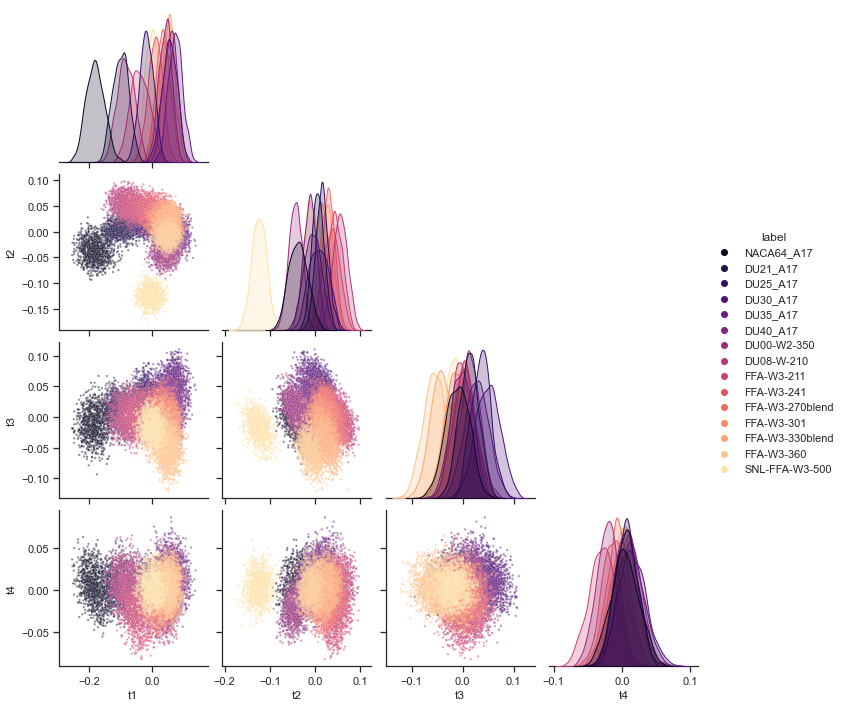

In [2]:
pga_dict = np.load(os.path.join(os.getcwd(), '../../data', 'PGA_space', 'PGA_space.npz'))
pga = PGAspace(pga_dict['Vh'], pga_dict['M_mean'], pga_dict['b_mean'], pga_dict['karcher_mean'])
pga.M_mean = pga.M_mean.T
t = np.load(os.path.join(os.getcwd(), '../../data', 'PGA_space', 't.npz'))['t']
# for sampling
pga.axis_min, pga.axis_max = np.min(t, axis=0),  np.max(t, axis=0)
r_min, r_max = np.abs(np.quantile(t, 0.0, axis=0)), np.abs(np.quantile(t, 0.0, axis=0))
pga.radius = np.max(np.array([r_min, r_max]), axis=0)

airfoils = ['NACA64_A17', 'DU21_A17', 'DU25_A17', 'DU30_A17', 'DU35_A17', 'DU40_A17', 'DU00-W2-350', 'DU08-W-210',
            'FFA-W3-211',  'FFA-W3-241', 'FFA-W3-270blend', 'FFA-W3-301', 'FFA-W3-330blend', 'FFA-W3-360', 'SNL-FFA-W3-500']

df = pd.DataFrame(data=t, columns=['t1', 't2', 't3', 't4'])
df['label'] = [airfoil for airfoil in airfoils for i in range(1001)]
splot = sns.pairplot(df, hue="label", x_vars=['t1', 't2', 't3', 't4'], y_vars=['t1', 't2', 't3', 't4'],
                        diag_kind='kde', palette="magma", corner=True, plot_kws=dict(alpha=.5, s=5))

### Load blade definition from .yaml file
Next we load a blade from .yaml file and generate blade interpolator based on Grassmann Interpolation class. 

In [3]:
blade_filename = 'IEA-15-240-RWT.yaml'
# blade_filename = 'nrel5mw_ofpolars.yaml'

shapes_path = os.path.join(os.getcwd(), "../../data", 'blades_yamls', blade_filename)

Blade = yaml_info.YamlInfo(shapes_path, n_landmarks=401)
nogap_shapes = np.empty_like(Blade.xy_landmarks)
for i, xy in enumerate(Blade.xy_landmarks):
    nogap_shapes[i] = remove_tailedge_gap(xy)
Blade.xy_nominal = Blade.shift_to_pitch_axis(Blade.eta_nominal)

Grassmann = GrassmannInterpolator(Blade.eta_nominal, Blade.xy_nominal)

eta_span = Grassmann.sample_eta(100, n_hub=10, n_tip=10, n_end=25)
Transform = TransformBlade(Blade.M_yaml_interpolator, Blade.b_yaml_interpolator, 
                           Blade.pitch_axis, Grassmann.interpolator_M, Grassmann.interpolator_b)

In [14]:
import plotly.graph_objects as go
def plot_3d_blade_with_nominal(shapes, shapes_nominal):
    N_eta_skp = 1
    N_arc_skp = 25
    line_b = go.scatter3d.Line(color="#1f77b4", width=1.)
    line_m = go.scatter3d.Line(color="#000000", width=4.)
    data = []

    # Plot Grassmann interpolator cross section refinements
    for i in range(0, int((shapes.shape[0])), N_eta_skp):
        data.append(go.Scatter3d(x=shapes[i, :, 2], y=shapes[i, :, 0], z=shapes[i, :, 1], mode='lines', line=line_b))

    # Plot tip
    i = int((shapes.shape[0])) - 1
    data.append(go.Scatter3d(x=shapes[i, :, 2], y=shapes[i, :, 0], z=shapes[i, :, 1],
                             mode='lines', line=line_b))
    # Plot span-wise landmarks
    span_line = np.empty((shapes.shape[1], shapes.shape[0], 3))
    for j in range(0, int((shapes.shape[1])), N_arc_skp):
        span_line[j] = shapes[:, j]
        data.append(go.Scatter3d(x=span_line[j, :, 2], y=span_line[j, :, 0], z=span_line[j, :, 1],
                                 mode='lines', line=line_b))

    # Plot nominal cross sections
    for i in range(0, int(shapes_nominal.shape[0])):
        nominal_x = shapes_nominal[i, :, 0].flatten()
        nominal_y = shapes_nominal[i, :, 1].flatten()
        nominal_z = shapes_nominal[i, :, 2].flatten()
        data.append(go.Scatter3d(x=nominal_z, y=nominal_x, z=nominal_y, mode='lines', line=line_m))

    fig = go.Figure(data=data)
    fig.update_layout(scene_aspectmode='data', showlegend=False)
    fig.update_scenes(xaxis_visible=False, yaxis_visible=False, zaxis_visible=False)
    fig.show()

In [15]:
_, blade = Grassmann(eta_span, grassmann=True)
xyz_local = Transform.grassmann_to_phys(blade, eta_span)
xyz_nominal = Transform.grassmann_to_phys(Grassmann.xy_grassmann, Grassmann.eta_nominal)
plot_3d_blade_with_nominal(xyz_local, xyz_nominal)

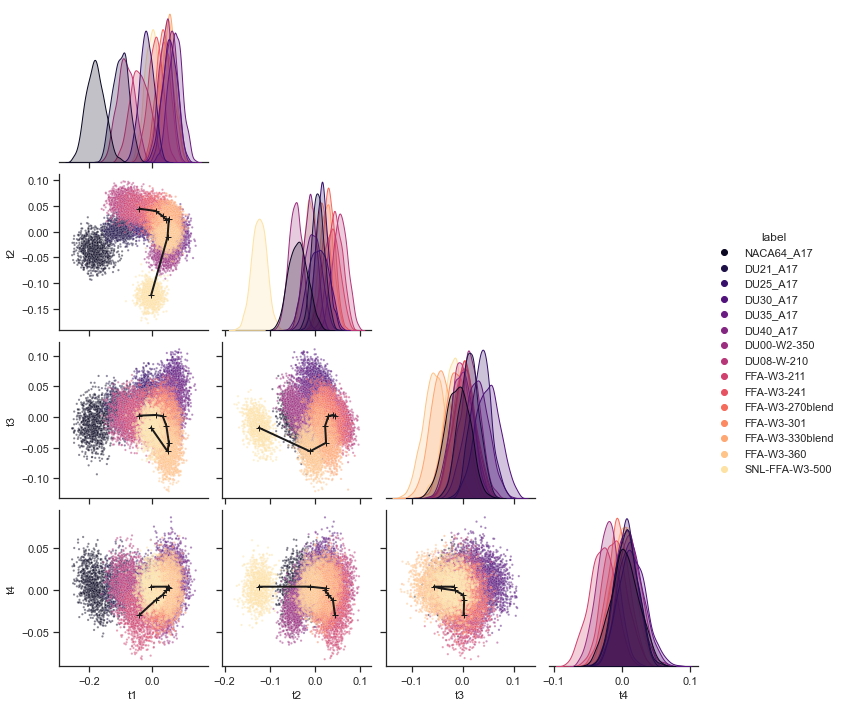

In [17]:
gr_blade, _, _ = landmark_affine_transform(nogap_shapes[2:-1])
blade = pga.gr_shapes2PGA(gr_blade)
splot = sns.pairplot(df, hue="label", x_vars=['t1', 't2', 't3', 't4'], y_vars=['t1', 't2', 't3', 't4'],
                        diag_kind='kde', palette="magma", corner=True, plot_kws=dict(alpha=.5, s=5))
splot.axes[1,0].plot(blade[:,0], blade[:,1], lw=2, color='k', ls='-', marker="+")
splot.axes[2,0].plot(blade[:,0], blade[:,2], lw=2, color='k', ls='-', marker="+")
splot.axes[3,0].plot(blade[:,0], blade[:,3], lw=2, color='k', ls='-', marker="+")
splot.axes[2,1].plot(blade[:,1], blade[:,2], lw=2, color='k', ls='-', marker="+")
splot.axes[3,1].plot(blade[:,1], blade[:,3], lw=2, color='k', ls='-', marker="+")
splot.axes[3,2].plot(blade[:,2], blade[:,3], lw=2, color='k', ls='-', marker="+")

In [7]:
perturbation, coef = pga.generate_perturbed_blade(gr_blade, coef=None, n=1)
t_perturbation = pga.gr_shapes2PGA(perturbation)

generating new coef


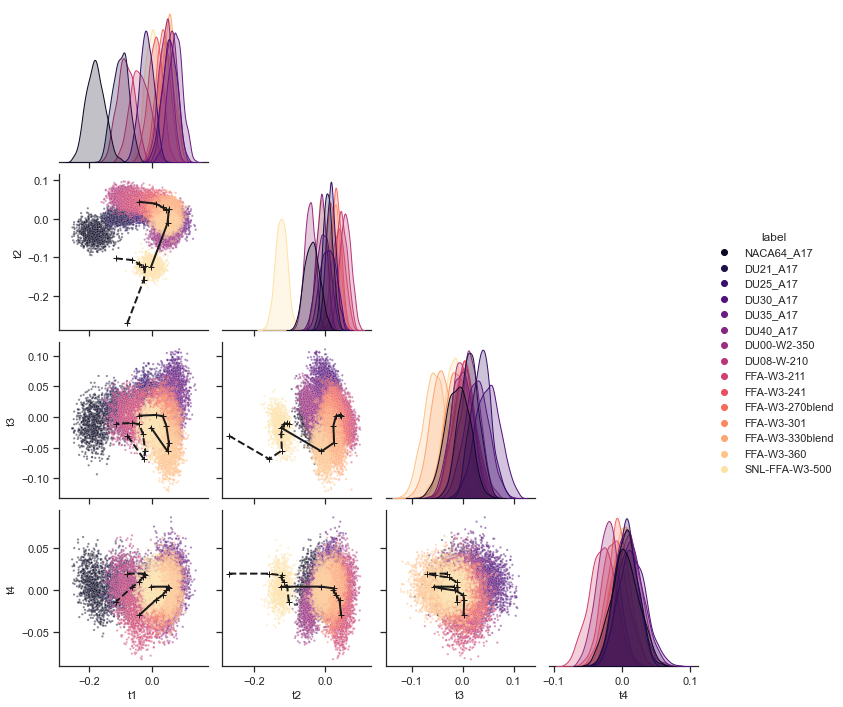

In [18]:
splot = sns.pairplot(df, hue="label", x_vars=['t1', 't2', 't3', 't4'], y_vars=['t1', 't2', 't3', 't4'],
                        diag_kind='kde', palette="magma", corner=True, plot_kws=dict(alpha=.5, s=5))
blade_line = ['-', 'dashed']
for k, plt_blade in enumerate([blade, t_perturbation]):
    splot.axes[1,0].plot(plt_blade[:,0], plt_blade[:,1], lw=2, color='k', ls=blade_line[k], marker="+")
    splot.axes[2,0].plot(plt_blade[:,0], plt_blade[:,2], lw=2, color='k', ls=blade_line[k], marker="+")
    splot.axes[3,0].plot(plt_blade[:,0], plt_blade[:,3], lw=2, color='k', ls=blade_line[k], marker="+")
    splot.axes[2,1].plot(plt_blade[:,1], plt_blade[:,2], lw=2, color='k', ls=blade_line[k], marker="+")
    splot.axes[3,1].plot(plt_blade[:,1], plt_blade[:,3], lw=2, color='k', ls=blade_line[k], marker="+")
    splot.axes[3,2].plot(plt_blade[:,2], plt_blade[:,3], lw=2, color='k', ls=blade_line[k], marker="+")

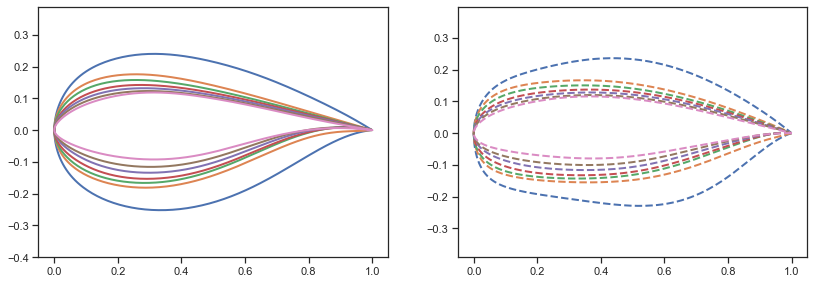

In [20]:
from g2aero.utils import position_airfoil
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
for i, (shape, new, m) in enumerate(zip(gr_blade, perturbation, Grassmann.M[2:-1])):
    old_phys = position_airfoil(shape@m)
    new_phys = position_airfoil(new@m)
    ax[0].plot(old_phys[:, 0], old_phys[:, 1], lw=2); 
    ax[1].plot(new_phys[:, 0], new_phys[ :, 1], ls='--', lw=2);
ax[0].axis('equal')
ax[1].axis('equal')
fig.subplots_adjust(left=0.1, right=0.99, bottom=0.12, top=0.99)

In [21]:
perturbation = np.vstack((perturbation, perturbation[-1:]))
Grassmann.shapes_perturbation(perturbation, np.arange(2, Grassmann.n_shapes))
_, new_blade = Grassmann(eta_span, grassmann=True)
xyz_local = Transform.grassmann_to_phys(new_blade, eta_span)
xyz_nominal = Transform.grassmann_to_phys(Grassmann.xy_grassmann, Grassmann.eta_nominal)
plot_3d_blade_with_nominal(xyz_local, xyz_nominal)